In [1]:
%matplotlib inline

import datacube
from datacube.storage import masking

dc = datacube.Datacube(app='test_animation')

In [2]:
#Agriculture 
area_name ='burundi'
query = {'lat': (-3.29, -3.16), 'lon':(29.29,29.42), #'lat': (-3.34, -3.16), 'lon':(29.25,29.43),
        'output_crs': 'EPSG:32635', 'time':('2014-12-01', '2018-12-30'),
        'resolution': (-30,30),
        }
rgb_bands = ['red','green','blue']
band_index = 'ndvi'
clear_frac = 0.95
band_index_cmap = 'RdYlGn'
band_index_min, band_index_max = 0.1, 0.7
sensors = [5,7,8]
mask_cloud = False
percentile_stretch = (0.02, 0.98)
resample = None #'3M'
rolling = False
interval = 1000

In [3]:
import xarray as xr
from skimage.morphology import disk, binary_dilation

bad = ['LC08_L1TP_205049_20161126_20170317_01_T1', 'LC08_L1TP_168061_20140627_20170421_01_T1',
       'LC08_L1TP_195056_20130621_20170504_01_T1','LC08_L1TP_195056_20141201_20170417_01_T1',
       'LC08_L1TP_195056_20161120_20170318_01_T1','LC08_L1TP_173062_20161126_20170317_01_T1',
       'LC08_L1TP_173062_20170724_20170809_01_T1']

def load_and_combine(query, base_bands =['red','green','blue'], band_index = None, mask_cloud=True,
                     dilation=0, clear_frac=0.8, sensors=[5,7,8]):
    bands = base_bands.copy()
    if not band_index is None:
        if band_index.lower() == 'mndwi':
            if not 'green' in bands: bands += ['green']
            if not 'swir1' in bands: bands += ['swir1']
        if band_index.lower() == 'ndbi':
            if not 'nir' in bands: bands += ['nir']
            if not 'swir1' in bands: bands += ['swir1']
        if band_index.lower() == 'ndvi':
            if not 'nir' in bands: bands += ['nir']
            if not 'red' in bands: bands += ['red']
    
    datasets =[]
    for sensor in sensors:
        product = 'ls%d_usgs_sr_scene'%sensor
        
        dss = dc.find_datasets(
            product=product, measurements=bands,**query)
        #print("Found %d datasets for Landsat %d."%(len(dss), sensor))
        for bad_id in bad: dss = [dataset for dataset in dss if not bad_id in dataset.uris[0]]
        print("Found %d good datasets for Landsat %d."%(len(dss), sensor))
        if len(dss)==0:continue

        if len(dss)>100 and (not 'time' in query):
            ds_set =[]
            for time_slice in [('1980-01-01','1999-12-31'), ('2000-01-01','2004-12-31'), ('2005-01-01','2009-12-31'),
                               ('2010-01-01','2014-12-31'), ('2015-01-01','2020-01-01')]:
                sub_query = query.copy()
                sub_query['time'] = time_slice
                dss = dc.find_datasets(product=product, measurements=bands,**sub_query)
                for bad_id in bad: dss = [dataset for dataset in dss if not bad_id in dataset.uris[0]]
                print("Found %d good datasets for Landsat %d for %s to %s."%(len(dss), sensor, time_slice[0],time_slice[1]))
                if len(dss)==0:continue
                ds = dc.load(product=product, group_by='solar_day', datasets=dss, measurements=bands,**sub_query)
                pq = dc.load(product=product, group_by='solar_day', datasets=dss, measurements=['pixel_qa'],**sub_query)
                mask = masking.make_mask(pq.pixel_qa, cloud='no_cloud', cloud_shadow='no_cloud_shadow', nodata=False)
                if 'blue' in ds: mask = mask & (ds.blue<1000)
                if dilation >0:
                    mask = ~(~mask).groupby('time').apply(binary_dilation,selem=disk(10))
                good = mask.groupby('time').mean() >= clear_frac
                if good.sum()==0: continue
                ds_clean = ds.isel(time=good)
                if mask_cloud:
                    ds_clean = ds_clean.where(mask.isel(time=good))
                ds_clean = ds_clean.where(ds_clean>0,) 
                ds_clean['mask'] = mask.isel(time=good)
                ds_set.append(ds_clean)
                print("Found %d clear observations for Landsat %d."%(len(ds_clean.time), sensor))
               
            ds_clean = xr.concat(ds_set, dim='time')
            
        else:
            ds = dc.load(product=product, group_by='solar_day', datasets=dss, measurements=bands,**query)
            pq = dc.load(product=product, group_by='solar_day', datasets=dss, measurements=['pixel_qa'],**query)
            mask = masking.make_mask(pq.pixel_qa, cloud='no_cloud', cloud_shadow='no_cloud_shadow', nodata=False)
            if 'blue' in ds: mask = mask & (ds.blue<1000)
            if dilation >0:
                mask = ~(~mask).groupby('time').apply(binary_dilation,selem=disk(10))
            good = mask.groupby('time').mean() >= clear_frac
            if good.sum()==0: continue
            ds_clean = ds.isel(time=good)
            if mask_cloud:
                    ds_clean = ds_clean.where(mask.isel(time=good))
            ds_clean = ds_clean.where(ds_clean>0,) 
            ds_clean['mask'] = mask.isel(time=good)
            print("Found %d clear observations for Landsat %d."%(len(ds_clean.time), sensor))
        
        if not band_index is None:
            if band_index.lower() == 'mndwi': 
                ds_clean[band_index] = (ds_clean.green-ds_clean.swir1)/(ds_clean.green+ds_clean.swir1)
            if band_index.lower() == 'ndbi':
                ds_clean[band_index] = (ds_clean.swir1-ds_clean.nir)/(ds_clean.swir1+ds_clean.nir)
            if band_index.lower() == 'ndvi':
                ds_clean[band_index] = (ds_clean.nir-ds_clean.red)/(ds_clean.nir+ds_clean.red)
        #ds_clean[band_index] = ds_clean[band_index].where(ds_clean.mask)
        datasets.append(ds_clean)
    
    if len(datasets)>0:
        combined_ds = xr.concat(datasets, dim='time')
        combined_ds = combined_ds.sortby('time')
        return combined_ds
    else: return None
    

In [4]:
ds = load_and_combine(query, base_bands = rgb_bands, band_index = band_index, clear_frac=clear_frac, 
                      mask_cloud=mask_cloud, sensors=sensors)

Found 0 good datasets for Landsat 5.
Found 90 good datasets for Landsat 7.


/usr/local/lib/python3.6/dist-packages/xarray/core/groupby.py:639: FutureWarning: Default reduction dimension will be changed to the grouped dimension in a future version of xarray. To silence this warning, pass dim=xarray.ALL_DIMS explicitly.
  skipna=skipna, allow_lazy=True, **kwargs)


Found 197 good datasets for Landsat 8.


/usr/local/lib/python3.6/dist-packages/xarray/core/groupby.py:639: FutureWarning: Default reduction dimension will be changed to the grouped dimension in a future version of xarray. To silence this warning, pass dim=xarray.ALL_DIMS explicitly.
  skipna=skipna, allow_lazy=True, **kwargs)


Found 27 clear observations for Landsat 8.


In [5]:
#for a, b in zip(ds.time.values,ds.mask.groupby('time').mean().values):print(a,b)

In [6]:
#if area_name == 'burundi':
#    good = ds[band_index].groupby('time').max().values >0.2
#    ds = ds.isel(time=good)

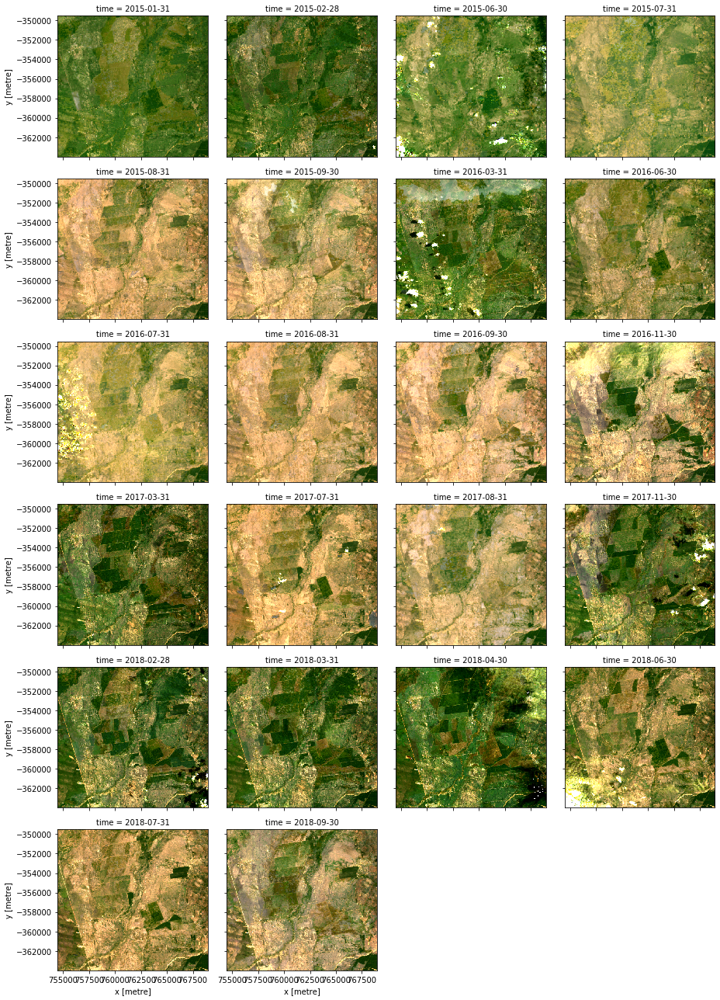

In [15]:
ds.resample(time='1M').last().dropna('time', how='all')[['red', 'green', 'blue']].to_array().plot.imshow(col='time',col_wrap=4, robust=True);

In [7]:
#ds = ds[rgb_bands+[band_index]]
if resample:
    if not rolling:
        combined_ds = ds.resample(time=resample).median().dropna('time', how='all')
    else:
        combined_ds = ds.resample(time=resample).median().rolling(time=3, center=True, min_periods=1).median().dropna('time', how='all')
else:
    combined_ds = ds#.resample(time='1M').last().dropna('time', how='all')

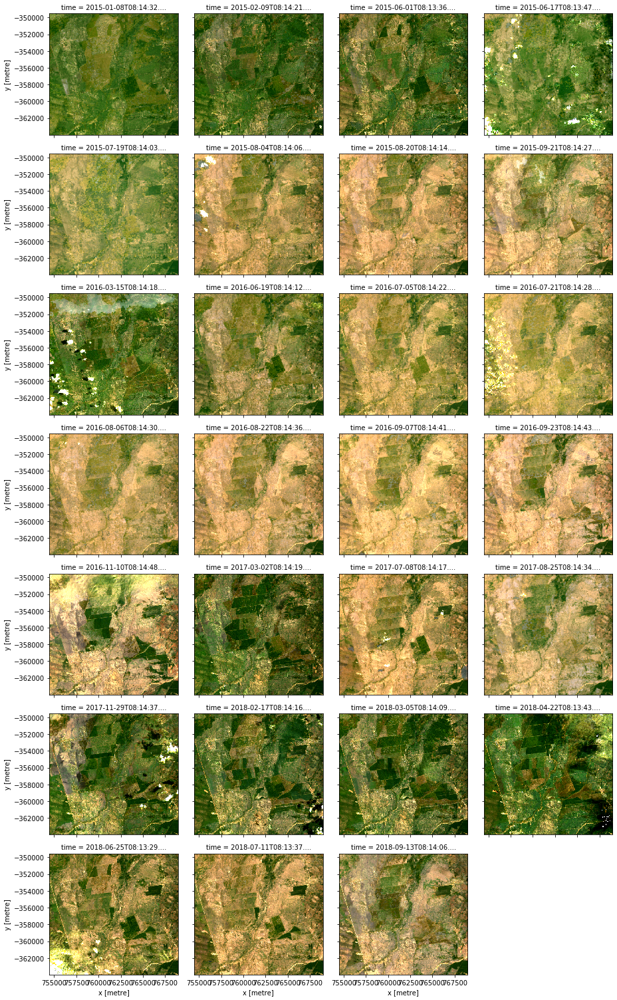

In [8]:
combined_ds[['red', 'green', 'blue']].to_array().plot.imshow(col='time',col_wrap=4, robust=True);

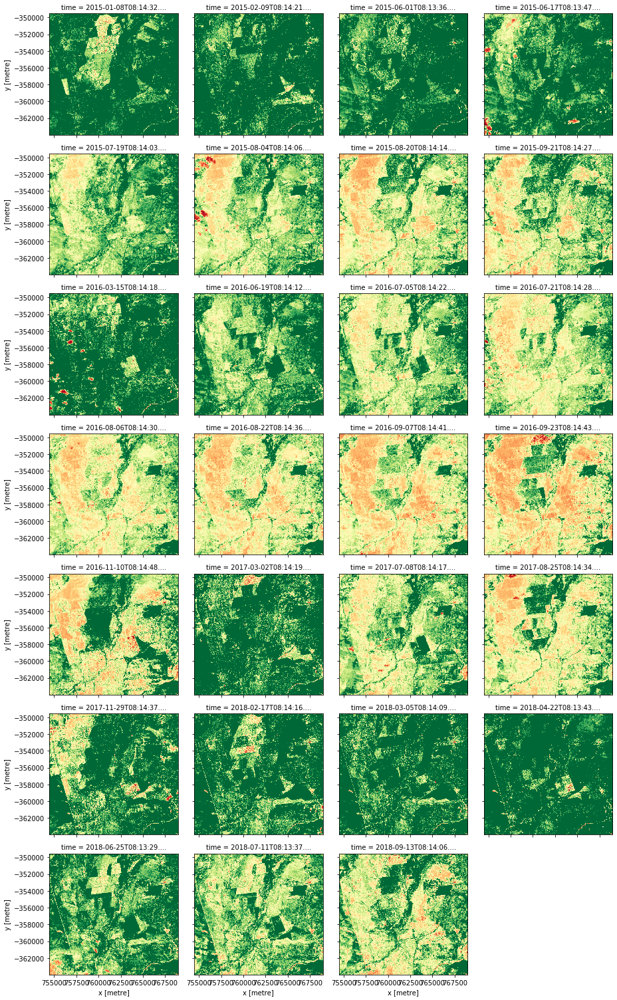

In [9]:
combined_ds[band_index].plot.imshow(col='time',col_wrap=4,vmin=0.1, vmax=0.6, cmap=band_index_cmap, add_colorbar=False);

In [10]:
if area_name == 'st_louis':
    combined_ds = combined_ds.isel(time=slice(28, len(combined_ds.time)))

Generating 27 frame animation (i.e. timesteps in shortest dataset)


MovieWriter imagemagick unavailable; trying to use <class 'matplotlib.animation.PillowWriter'> instead.


    Exporting animation to burundi_with_ndvi.gif


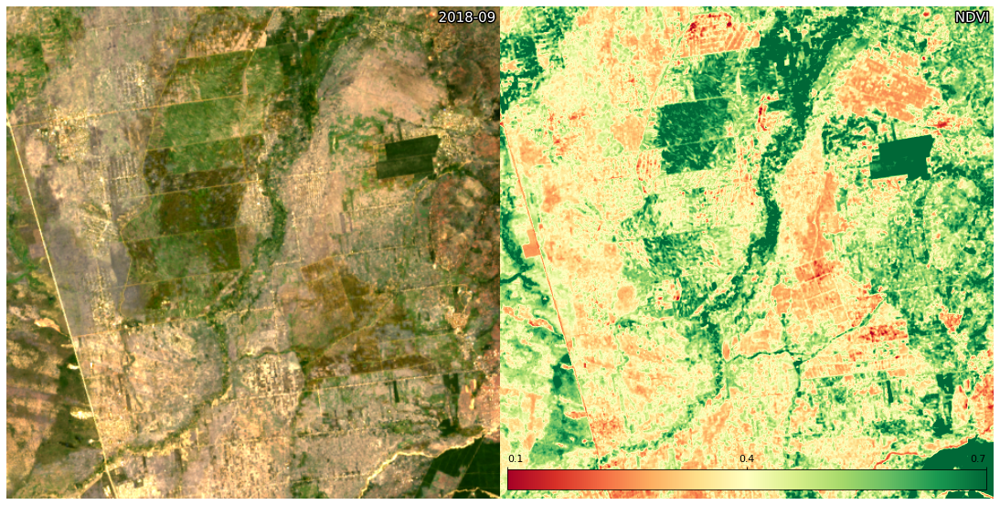

In [11]:
from DEAPlotting import animated_timeseries, animated_doubletimeseries

if resample: date_type = 'M8[Y]'
else: date_type = 'M8[M]'

if band_index:
    animated_doubletimeseries(combined_ds[rgb_bands], combined_ds[[band_index]], '%s_with_%s.gif'%(area_name, band_index), 
                              width_pixels=1500, interval=interval, 
                              bands1=rgb_bands, bands2=[band_index],                               
                              percentile_stretch1 = percentile_stretch, percentile_stretch2 = percentile_stretch,
                              vmin_2 = band_index_min, vmax_2 = band_index_max,
                              image_proc_func1=None, image_proc_func2=None,
                              title1=combined_ds.time.values.astype(date_type), title2=band_index.upper(), #combined_ds.time.values.astype('M8[Y]'),
                              show_date1=False, show_date2=False, animation_options = {'repeat_delay': interval*2},
                              annotation_kwargs1={}, annotation_kwargs2={},
                              onebandplot_cbar1=True, onebandplot_cbar2=True,
                              onebandplot_kwargs1={}, onebandplot_kwargs2={'cmap':band_index_cmap},
                              shapefile_path1=None, shapefile_path2=None,
                              shapefile_kwargs1={}, shapefile_kwargs2={},
                              time_dim1 = 'time', x_dim1 = 'x', y_dim1 = 'y',
                              time_dim2 = 'time', x_dim2 = 'x', y_dim2 = 'y')

MovieWriter imagemagick unavailable; trying to use <class 'matplotlib.animation.PillowWriter'> instead.


Generating 27 frame animation
    Exporting animation to burundi_truecolor.gif


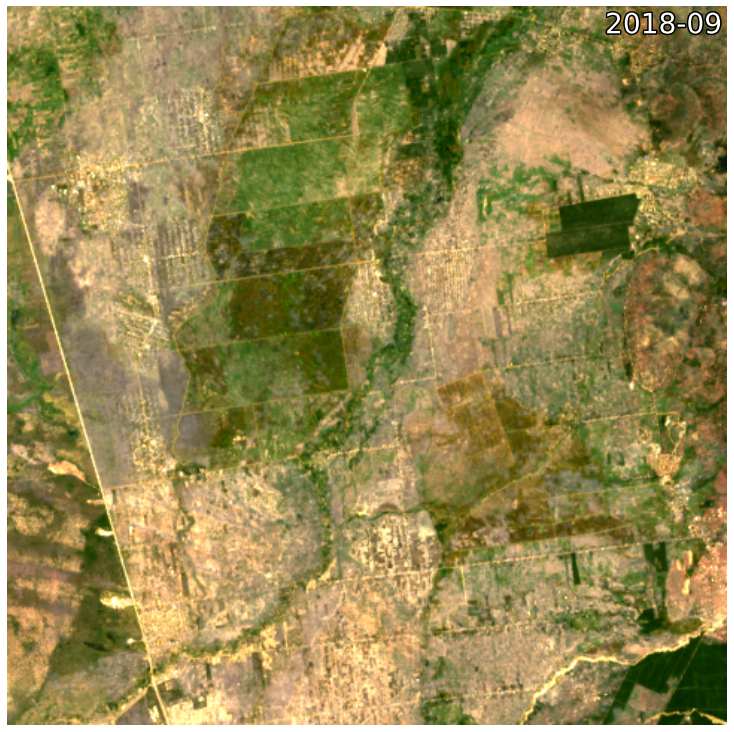

In [12]:
from DEAPlotting import animated_timeseries
animated_timeseries(combined_ds[rgb_bands], '%s_truecolor.gif'%(area_name), 
                    width_pixels=1000, interval=interval, 
                    bands=rgb_bands,                           
                    percentile_stretch = percentile_stretch, 
                    image_proc_func=None, 
                    title=combined_ds.time.values.astype(date_type), 
                    show_date=False, animation_options = {'repeat_delay': interval*2},
                    annotation_kwargs={}, 
                    onebandplot_cbar=True, 
                    onebandplot_kwargs={}, 
                    shapefile_path=None,
                    shapefile_kwargs={}, 
                    time_dim = 'time', x_dim = 'x', y_dim = 'y')